# Image Compression (SVD, PCA, JPEG, and PNG)
## Ross Woleben
This notebook is a supplement to the [Image Compression (SVD, PCA, JPEG, and PNG)](https://www.rosswoleben.com/projects/image-compression) post on my website. This notebook discusses the derivations and mathematical concepts of SVD and PCA, as well as more specific details of the JPEG and PNG algorithms. 

In [1]:
import matplotlib.pyplot as plt
from matplotlib import image
import numpy as np
from PIL import Image
import os
from sklearn.decomposition import PCA

## SVD Explanation

Singular Value Decomposition (SVD) is a matrix factorization such that any matrix A can be written as $A = U \Sigma V^T$, where U and $V^T$ form orthonormal bases and $\Sigma$ is a diagonal matrix containing the singular values of the matrix in descending order. Geometrically, $U \Sigma V^T$ can be interpreted as a rotation, followed by a scaling factor, followed by another rotation.

We can modify the SVD to make a lower dimension reprojection of our data through a rank-k approximation. The rank of a matrix refers to the total number of linearly independent rows or columns of a matrix. In most datasets, it is safe to assume that all rows and columns of the matrix are linearly independent, meaning that the rank of a matrix $r$ is defined as $r \leq min\{m,n\}$ where m represents the number of rows in a matrix, and n represents the number of columns. This low-rank approximation of SVD is calculated by taking the top k singular vectors and singular values such that
$$M^*_{m x n} = U_{m x k} \Sigma_{k x k} V^T_{k x n}$$
where $M^*$ is a rank-k approximation of our original data, and $k \leq r$.

Now that we have a mathematical underpinning for SVD, we can perform it on an image to create a lower-dimensional reconstruction of an image that in theory should require less storage.

## SVD Image Compression Demo

In [2]:
# Photo via Kym Ellis on Unsplash
# https://unsplash.com/photos/Ye6rupMjAWk?utm_source=unsplash&utm_medium=referral&utm_content=creditShareLink
norway_image = image.imread("norway.jpg")

In [3]:
# Shape is 1280 rows, 1920 colunms, 3 color channels
# resolution is (1920 x 1280)
norway_image.shape

(1280, 1920, 3)

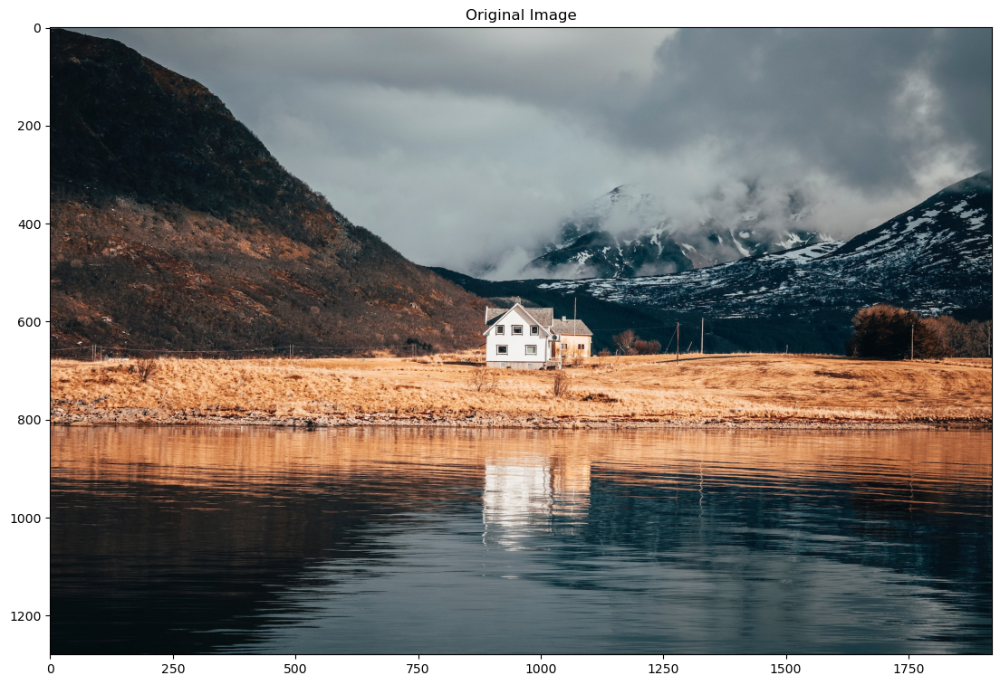

In [4]:
plt.figure(figsize=(16,9))
plt.imshow(norway_image)
plt.title("Original Image")
plt.show()

In [5]:
# lets define a few helper functions that will streamline the process of performing SVD on each color channel
def get_color_channels(image):
    red = image[:,:,0]
    green = image[:,:,1]
    blue = image[:,:,2]
    return (red, green, blue)

def rgb_svd(r, g, b):
    USvT_r = np.linalg.svd(r)
    USvT_g = np.linalg.svd(g)
    USvT_b = np.linalg.svd(b)
    
    return (USvT_r, USvT_g, USvT_b)
    
def rank_approximation(svd_data: tuple, k):
    U = svd_data[0]
    S = svd_data[1]
    vT = svd_data[2]
    return U[:, :k] @ np.diag(S[:k]) @ vT[:k, :]

def reassemble_image(red, green, blue):
    rank_k_approximation = np.zeros((red.shape[0], red.shape[1], 3))
    rank_k_approximation[:,:,0] = red/256
    rank_k_approximation[:,:,1] = green/256
    rank_k_approximation[:,:,2] = blue/256
    
    # If SVD resulted in value > 1, replace it with 1, as that is the maximum color level for that
    # specific pixel.
    rank_k_approximation = np.where(rank_k_approximation > 1, 1, rank_k_approximation)
    rank_k_approximation = np.where(rank_k_approximation < 0, 0, rank_k_approximation)
    # Return final rank-k approximated image
    return rank_k_approximation


In [6]:
(red_channel, green_channel, blue_channel) = get_color_channels(norway_image)
(svd_r, svd_g, svd_b) = rgb_svd(red_channel, green_channel, blue_channel)

k = 100
rank_k_red = rank_approximation(svd_r, k)
rank_k_green = rank_approximation(svd_g, k)
rank_k_blue = rank_approximation(svd_b, k)

# Assemble components back into single image
approximation = reassemble_image(rank_k_red, rank_k_green, rank_k_blue)

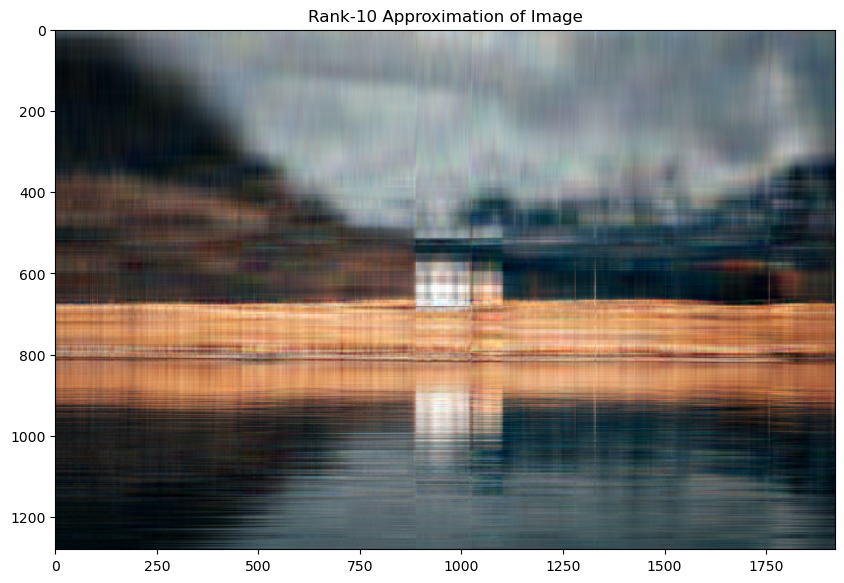

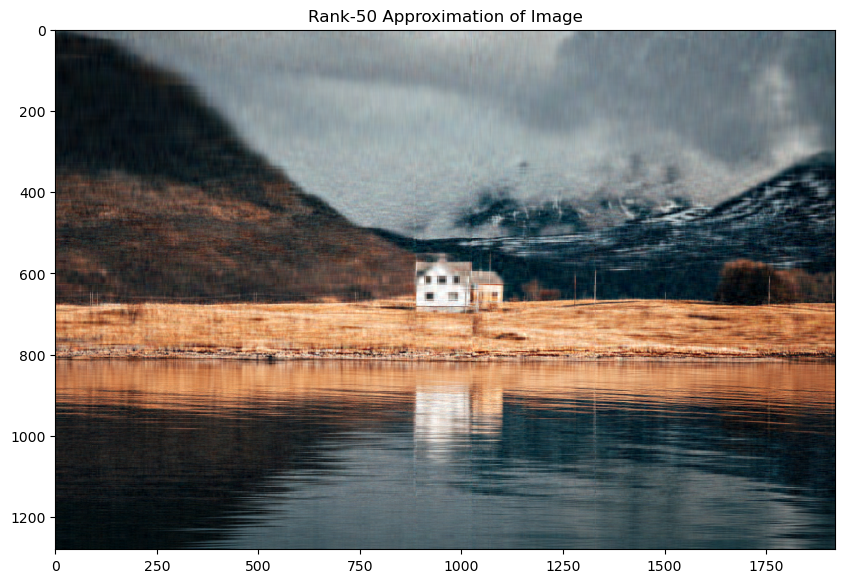

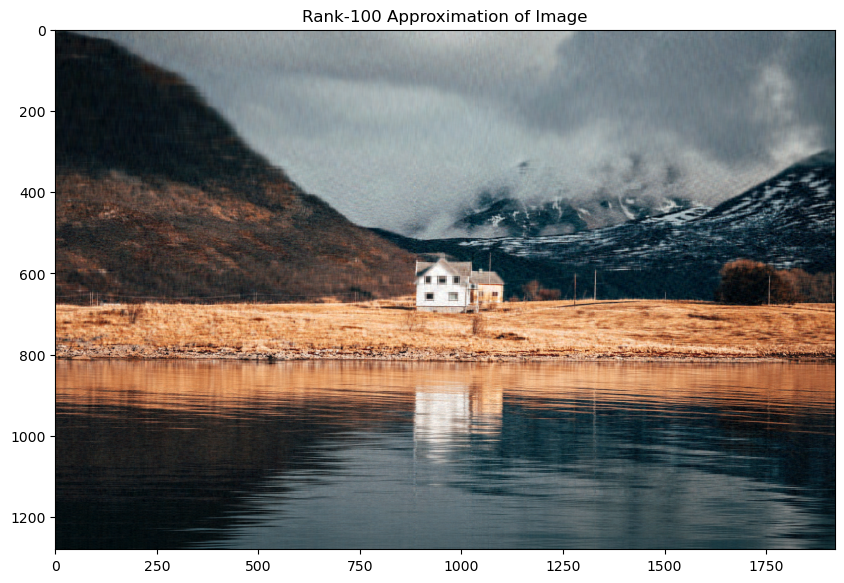

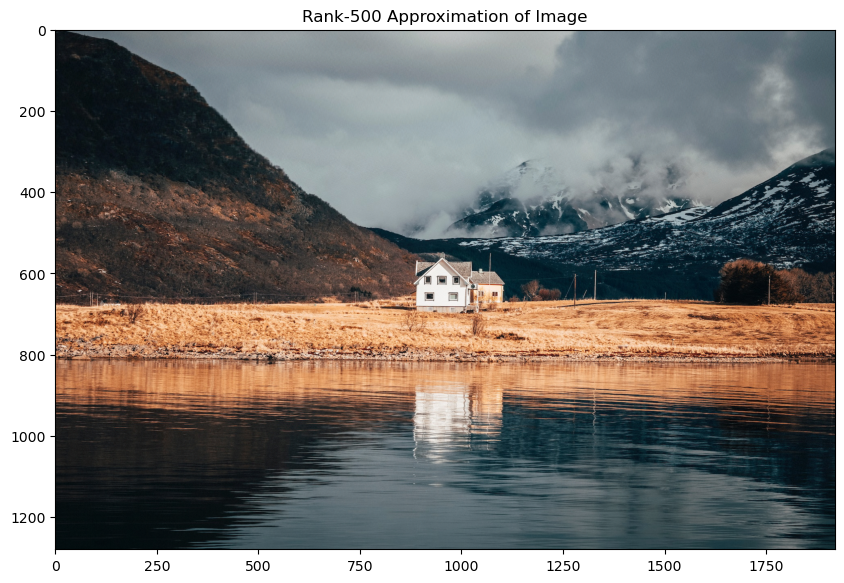

In [7]:
rank = [10, 50, 100, 500]
for k in rank:
    rank_k_red = rank_approximation(svd_r, k)
    rank_k_green = rank_approximation(svd_g, k)
    rank_k_blue = rank_approximation(svd_b, k)

    # Assemble components back into single image
    approximation_ = reassemble_image(rank_k_red, rank_k_green, rank_k_blue)
    
    plt.figure(figsize=(12,6.75))
    plt.imshow(approximation_)
    plt.title(f"Rank-{str(k)} Approximation of Image")
    plt.show()

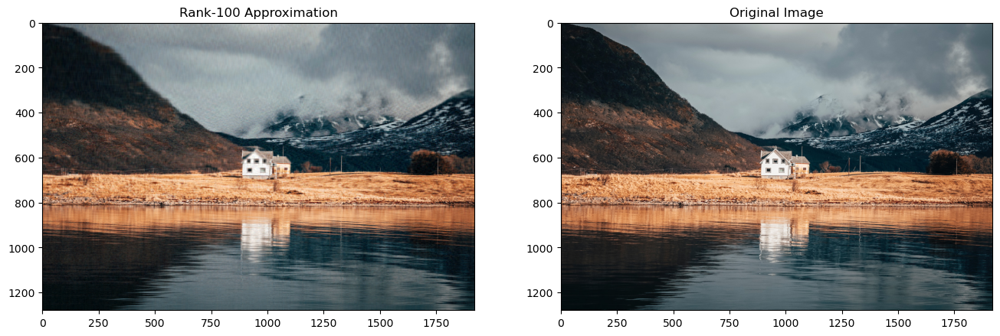

In [8]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 9))
axes[0].imshow(approximation)
axes[0].set(title = 'Rank-100 Approximation')
axes[1].imshow(norway_image)
axes[1].set(title = 'Original Image')
plt.show()

As you can see, a rank-100 approximation of our original image retains most of the identifiable features of the original image, even after excluding a decent amount of its original information. Now let's talk about a specific case of SVD: Principal Component Analysis.

## PCA Explained

One of the primary goals of PCA is to identify the directions of maximum variance to reduce the dimensionality of data.

It can mathematically be written in the form:
$$w_1 = argmax_{\lvert \lvert w \rvert \rvert =1} \frac{1}{n} \Sigma_{i=1}^n ( \tilde{x_i}^T w)^2$$
where $\tilde{x_i}^T$ is a row in our dataset centered around 0 and w is a direction vector, so $\tilde{x_i}^T w_1$ becomes the first principal component of our data. We can find the resulting k principal components using $w_k = \genfrac{}{}{0pt}{}{argmax_{\lvert \lvert w \rvert \rvert =1}}{w \perp w_1, ..., w_{k-1}} \frac{1}{n} \Sigma_{i=1}^n ( \tilde{x_i}^T w)^2$, where each direction vector $w_i$ forms an orthogonal basis, meaning each direction is as dissimilar as possible from the other components. 

With the setup above, PCA becomes an iterative optimization problem; however, I think PCA is much more intuitive when calculating all principal components at once by performing an eigendecomposition$^*$. An eigenpair (pair of an eigenvalue and eigenvector) is an incredibly useful concept in linear algebra as it essentially explains how a matrix is constructed through a series of linear transformations: an eigenvalue determines the magnitude of variance, and an eigenvector determines the direction of variance. The eigenvalue decomposition of a matrix is formulated by 
$$A = Q \Lambda Q^{-1}$$
where Q is a matrix of eigenvectors and $\Lambda$ is a diagonal matrix containing eigenvalues; this decomposition is derived from the fundamental property of eigenvectors: $Av = \lambda v$. With all of the eigenpairs of a matrix, you can entirely and perfectly recreate a matrix with a series of linear transformations. If you have a lot of redundant data in your matrix, the matrix can be reconstructed using relatively few eigenpairs with high accuracy (the top eigenpairs capture a lot of the variation of the original data).

$^*$Note: In practice, calculating principal components via optimization is usually more effective because calculating the eigendecomposition can be computationally expensive. 

<br>
Since we said that eigenvalues are effectively the magnitudes of variance along an eigenvector, our optimization now approach now looks like:
$$w_1 = argmax_{\lvert \lvert w \rvert \rvert =1} w^T \tilde X^T \tilde X w $$
where $\tilde X^T \tilde X$ is the sample covariance of the mean-centered data. This recontextualizes the meaning of the optimization problem above as $\frac{1}{n} \Sigma_{i=1}^n ( \tilde{x_i}^T w)^2$ is literally just the sample variance of $x_1, ..., x_n$ along direction w. With this setup, we can find our first (most influential) principal component by finding the largest eigenvalue and corresponding eigenvector of $\tilde X^T \tilde X$. Furthermore, this formula looks incredibly similar to the eigendecomposition, so when our eigenvalues are sorted in descending order, we have an ordered list of our principal components. In that sense, PCA is effectively just a specific case of a Singular Value Decomposition.

## Connection between SVD and PCA

You may have noticed that the SVD ($A = U \Sigma V^t$) looks quite similar to the eigendecomposition ($A = Q \Lambda Q^{-1}$); in some cases these factorizations are identical. The covariance matrix $X^T X$ is incredibly convenient to work with because it is a symmetric, square, positive semi-definite matrix.


First, let's demonstrate mathematically when SVD and eigendecomposition are equivalent. Using the fact that $X = U\Sigma V^T$:
$$X^T X = (U \Sigma V^T)^T U \Sigma V^T = V\Sigma U^T U \Sigma V^T$$
Since we know that U and V are each orthonormal bases, $U^T U = I$, so we can simplify the expression above to $$X^T X = V\Sigma^2 V^T$$
In this context, our eigen decomposition is $X^T X = Q \Lambda Q^{-1}$. We can use the fact that the inverse of an orthogonal matrix is equal to the transpose of the orthogonal matrix $(Q^{-1}=Q^T)$, so the SVD representation of our covariance matrix is
$$X^T X = V\Sigma^2 V^T$$ and the PCA representation is 
$$X^T X = Q\Lambda Q^T$$

This shows that the singular values ($\Sigma$) are the square roots of the eigenvalues ($\Lambda$) and the right singular vectors (V) are the eigenvectors (Q) in this specific setting.

Now that we understand the fundamentals of PCA, let's use it to process images.


## PCA Image Compression Demo

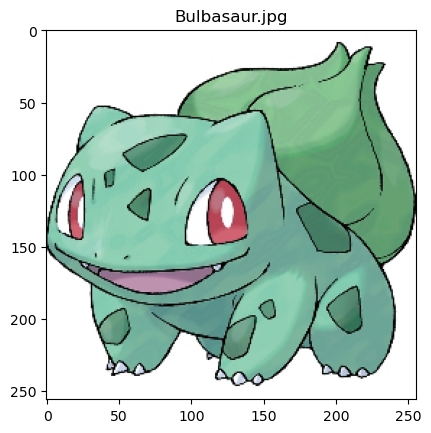

In [9]:
pokemon = np.load('pokemon.npy')
# Reshape data to make it easier to display images
pokemon = pokemon.reshape((819, 256, 256, 3))

plt.imshow(pokemon[0])
plt.title("Bulbasaur.jpg")
plt.show()

In [10]:
# Let's prepare our color channels for PCA
red_channel = pokemon[:,:,:,0]
green_channel = pokemon[:,:,:,1]
blue_channel = pokemon[:,:,:,2]

r = red_channel.reshape((819, 256*256))
g = green_channel.reshape((819, 256*256))
b = blue_channel.reshape((819, 256*256))

In [11]:
# Change this number to play around with what different
# component number decompositions look like
component_decomposition = 100

pca = PCA(n_components = component_decomposition)
r_pca = pca.fit(r).components_.reshape(component_decomposition, 256, 256)
g_pca = pca.fit(g).components_.reshape(component_decomposition, 256, 256)
b_pca = pca.fit(b).components_.reshape(component_decomposition, 256, 256)

In [12]:
pca_plot = np.zeros((component_decomposition, 256, 256, 3))
pca_plot[:,:,:,0] = r_pca
pca_plot[:,:,:,1] = g_pca
pca_plot[:,:,:,2] = b_pca

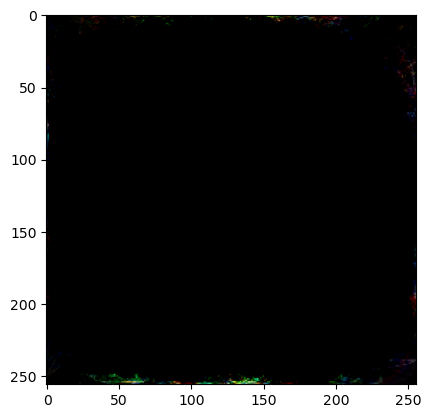

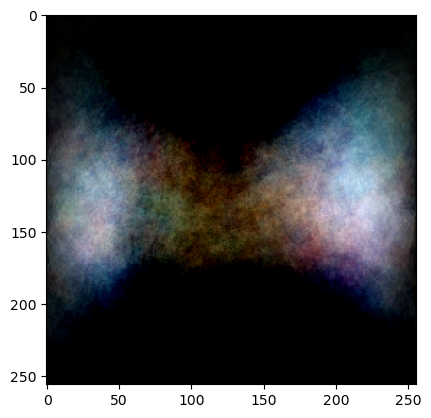

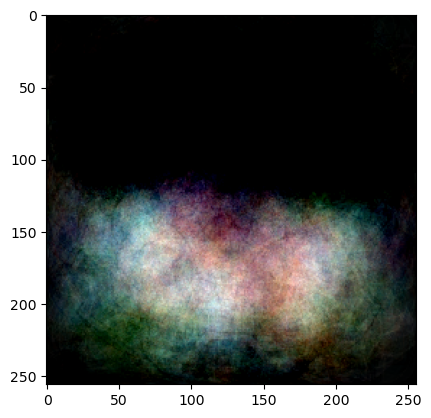

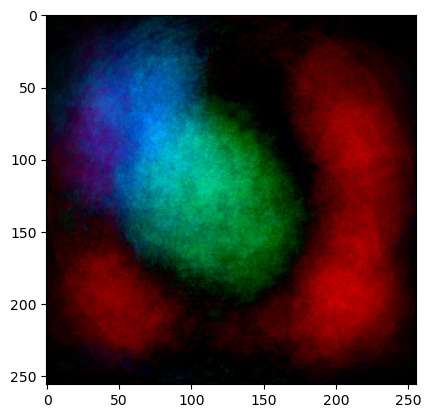

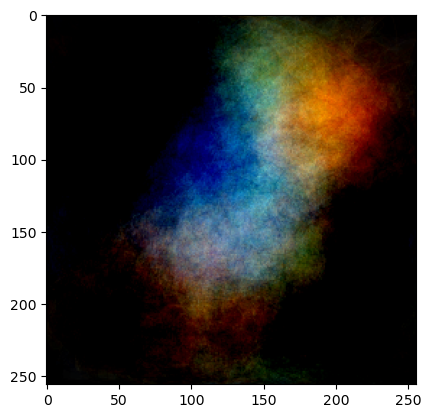

...

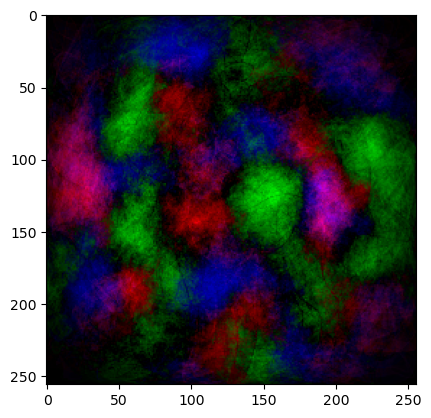

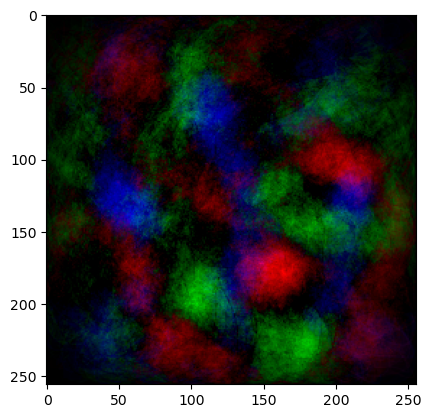

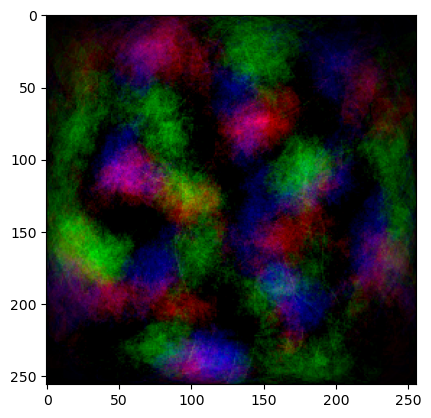

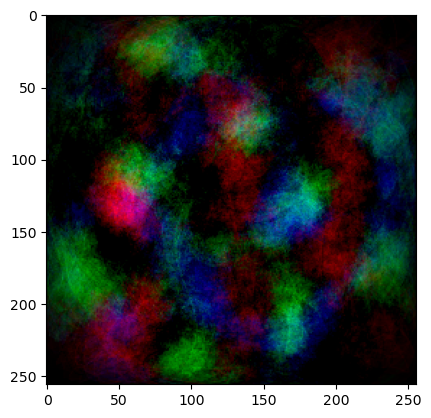

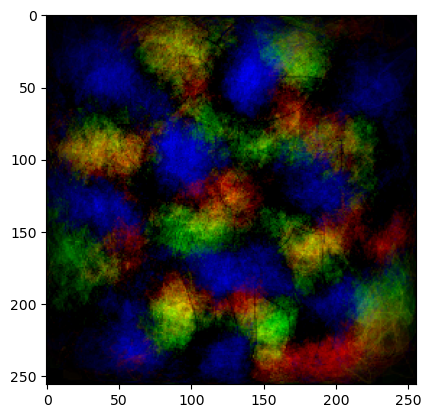

In [13]:
# Plot first 30 principal components
for i in range(30):
    Image = pca_plot[i]/np.amax(pca_plot[i])
    Image = np.clip(Image, 0, 1)
    plt.imshow(Image)
    plt.show()

In [14]:
# Reproject principal components onto original data to get our reconstructions of our images

components_r = pca.fit(r).transform(r)
projected_r = pca.inverse_transform(components_r)

components_g = pca.fit(g).transform(g)
projected_g = pca.inverse_transform(components_g)

components_b = pca.fit(b).transform(b)
projected_b = pca.inverse_transform(components_b)

In [15]:
# Prepare components for plotting
pca_projection = np.zeros((819, 256, 256, 3))
pca_projection[:,:,:,0] = projected_r.reshape((819, 256, 256))
pca_projection[:,:,:,1] = projected_g.reshape((819, 256, 256))
pca_projection[:,:,:,2] = projected_b.reshape((819, 256, 256))

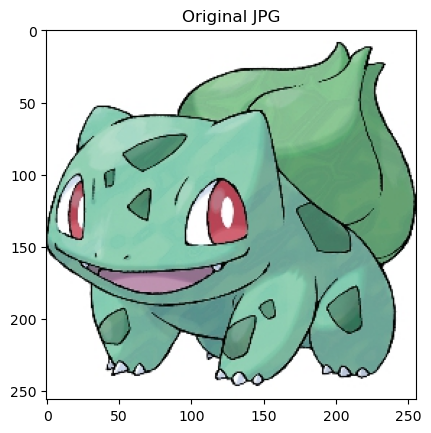

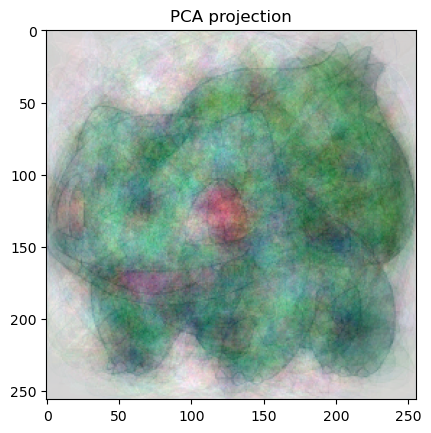

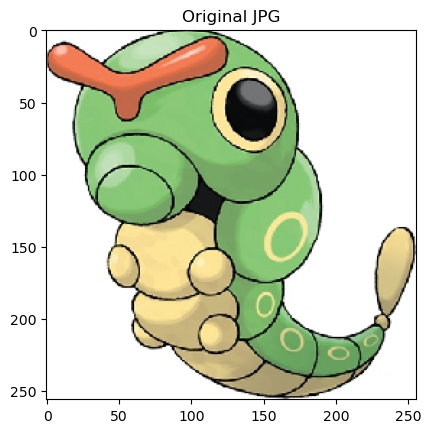

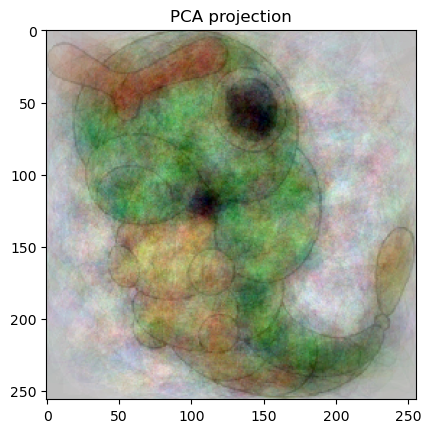

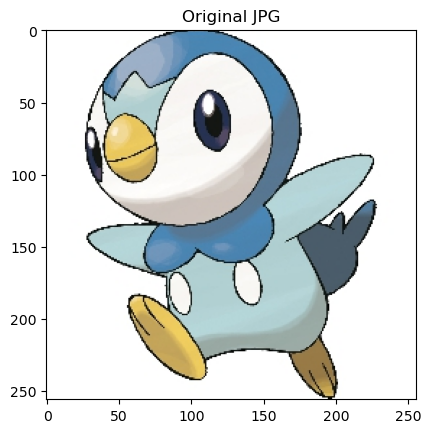

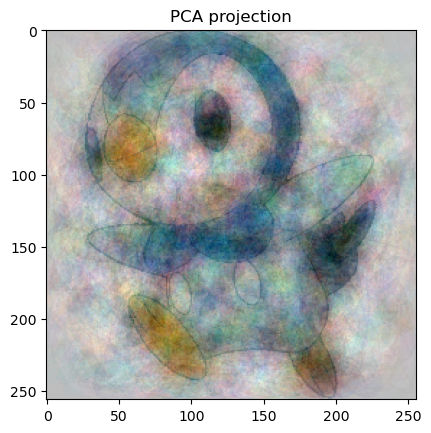

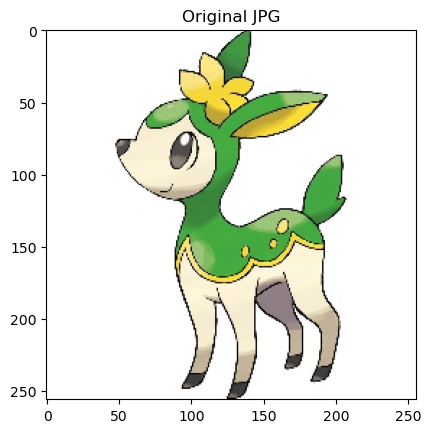

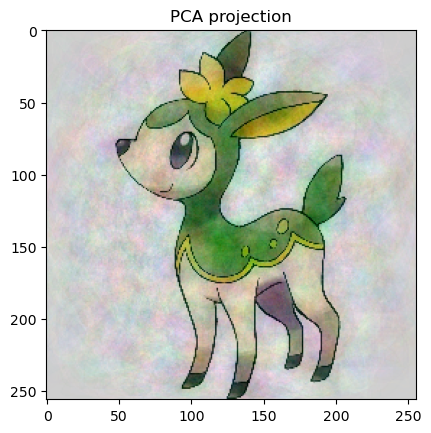

In [16]:
# [0, 1, 371, 608] is a list of indices from the Pokemon dataset that had interesting results 
for i in [0, 1, 371, 608]:
    Image = pca_projection[i]/np.amax(pca_projection[i])
    Image = np.clip(Image, 0, 1)
    plt.imshow(pokemon[i])
    plt.title("Original JPG")
    plt.show()
    plt.imshow(Image)
    plt.title("PCA projection")
    plt.show()

After performing PCA on this set of Pokemon images, we can now recreate any Pokemon as a linear combination of only 100 components of the original dataset.

Note that the PCA projection of Deerling (the Pokemon in the final two images) is especially clear because 4 nearly-identical forms are in the original dataset. As a result, some of the top principal components pick up on the variation of its specific outline.

## JPEG and PNG

Now that I've covered compression methods that are more commonly used in other avenues of data science, it's worth bringing up the most popular modern algorithms that were specifically designed for image compression: JPEG and PNG.

JPEG (Joint Photographic Experts Group) is a lossy image compression algorithm used to create a fine balance between image quality and file size.

PNG (Portable Network Graphics) is a lossless image compression algorithm created for the same purpose.

### JPEG Algorithm

1. Convert the image from the conventional RGB color space to the YCrCb color space.  This transforms the image from red, green, and blue color channels into a brightness channel and two alternative color channels before performing any type of compression. This is done because the human eye is more receptive to brightness rather than color, so isolating these channels helps prepare the image for the next steps.

2. Chroma downsampling or chroma subsampling. This step takes blocks of adjacent pixels of an image and averages or samples their two YCrCb color channels into one value per channel. This is a lossy step as it loses specific color information from individual pixels, but the difference is nearly imperceptible. 

3. Discrete Cosine Transform (DCT). This step expresses each channel of the image as a weighted sum of different frequencies in preparation for the quantization step - this is a lossless step.  
The DCT has many mathematical applications outside of image compression. The basic premise is to rewrite a series of discrete data points (pixel values in this context) as a sum of cosine functions weighted by frequencies. It draws many connections to Fourier Transforms and other non-linear function approximations. Here are the frequencies used for the DCT in the JPEG algorithm:

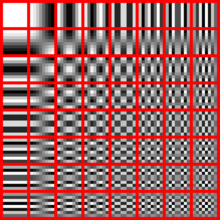

4. Quantization. Next, divide the coefficients obtained from the DCT by the corresponding elements of a quantization matrix, which is a grid that describes frequencies. Ideally, many of the resulting values of this operation will be zero, meaning that this representation of our image contains frequencies that our eyes won’t perceive and can be thrown away; this is where a lot of data can be truncated. 

5. Entropy Encoding. Lastly, we want to encode the values from the quantization step in a way that can optimize storage. First, run-length encoding (RLE) is performed to arrange the values that need to be stored, and then Huffman coding is performed to compress these values. Both of these encoding steps are lossless. When Huffman coding compresses the encoded values from the RLE, it also needs to store a decoding guide; the process of decoding Huffman codes entirely depends on the types of data it sees. Huffman coding is not very easy to learn without a visual example in my opinion, but the YouTube Channel [Reducible](https://www.youtube.com/watch?v=B3y0RsVCyrw) has a great video showing the intuition of Huffman coding as well as a brief history on its creation.

### PNG Algorithm

1. Filtering. In the context of PNG, filtering refers to row-by-row operations that measure the differences between pixels. PNG defines five types of filters: None, Sub, Up, Average, and Paeth. Here is a summary of each filter:

NONE: No filter is applied, just return the unadjusted pixel values

SUB: Calculate the difference between the pixel of interest and the pixel to the left of it

UP: Calculate the difference between the pixel of interest and the pixel above it

AVERAGE: Calculate the average between the adjacent pixels that are to the left of the pixel of interest and above the pixel of interest and then find the difference between that average quantity and the pixel of interest

PAETH: Find the sum of the adjacent pixels above, to the left, and above and to the left of the pixel of interest. Calculate three values: the sum minus the above pixel, the sum minus the left pixel, and the sum minus the above and to the left pixel. Take the minimum of these three values and find the difference between that and the pixel of interest.

For each row of an image, each of the five filtering methods is performed, and the final filtering technique for that row depends on the best-performing method. So for an image that is 1920 by 1080 pixels, there are a total of 5400 total filtering operations being performed. There is no mathematical proof that explains why this is an effective heuristic, but it has enabled PNG to be successful for nearly three decades.


2. LZ77 Encoding. This compression algorithm optimizes storage space by referencing earlier instances of repetitive data. For example, if an image contains ten identical white pixels in a row, an LZ77 encoder will copy the first instance of the pixel to memory, then instead of storing the values of the next nine pixels, it instead stores nine references to the first pixel. The algorithm is capable of encoding much more complex patterns of repetitive data, but this trivial example still provides the fundamental intuition. The YouTube Channel [Computerphile](https://www.youtube.com/watch?v=goOa3DGezUA) details the LZ77 algorithm compressing text, but it works the same way with image compression.


3. Huffman Coding. Just like the JPEG algorithm, the final compression step is Huffman coding. This lossless method is used to further optimize the storage of the LZ77 encoding. The combination of LZ77 Endcoding and Huffman coding is known as DEFLATE.

## JPEG Compression Demo
idea inspired by the [JPEG wikipedia page](https://en.wikipedia.org/wiki/JPEG).

This JPEG file compressed at 1 quality is 46.3740234375 KB
This JPEG file compressed at 3 quality is 50.4326171875 KB
This JPEG file compressed at 5 quality is 67.4912109375 KB
This JPEG file compressed at 10 quality is 109.9306640625 KB
This JPEG file compressed at 20 quality is 178.982421875 KB
This JPEG file compressed at 40 quality is 280.5283203125 KB
This JPEG file compressed at 80 quality is 579.875 KB
The original image is 757.16015625 KB


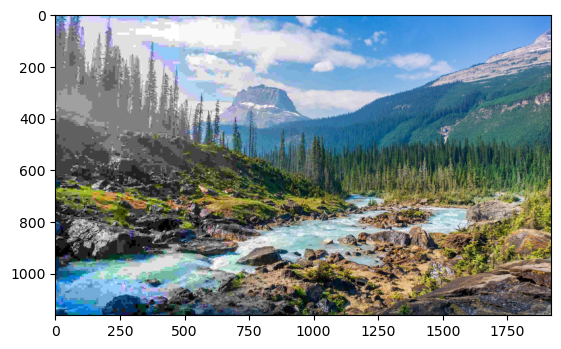

In [17]:
from PIL import Image
# photo via Hendrik Cornelissen
im1 = Image.open('valley.jpg')

compressed_image = np.zeros_like(im1)
for index, qual in enumerate([1, 3, 5, 10, 20, 40, 80]):
    # Want to access numpy array of compresssed image without actually writing and saving to disc
    filename = f"image_quality{qual}.jpg"
    im1.save(filename, "jpeg", quality = qual)
    new_image = image.imread(filename)
    compressed_image[:, index*240:(index+1)*240, :] = new_image[:, index*240:(index+1)*240, :]
    stats = os.stat(filename)
    print(f"This JPEG file compressed at {qual} quality is {stats.st_size/(1024)} KB")
    os.remove(filename)

print(f"The original image is {os.stat('valley.jpg').st_size/1024} KB")    
im1 = image.imread('valley.jpg')
compressed_image[:, (index+1)*240:, :] = im1[:, (index+1)*240:, :]
plt.imshow(compressed_image)
image.imsave('compressed_image.png', compressed_image)
plt.show()

## Resources

### SVD and PCA
https://en.wikipedia.org/wiki/Singular_value

https://en.wikipedia.org/wiki/Principal_component_analysis

https://mse.redwoods.edu/darnold/math45/laproj/fall2005/ninabeth/FinalPresentation.pdf

https://medium.com/@sebastiannorena/pca-principal-components-analysis-applied-to-images-of-faces-d2fc2c083371

https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

https://en.wikipedia.org/wiki/Eigendecomposition_of_a_matrix

### JPEG and PNG
https://www.youtube.com/watch?v=0me3guauqOU

https://www.youtube.com/watch?v=EFUYNoFRHQI

https://www.youtube.com/watch?v=Kv1Hiv3ox8I

https://www.youtube.com/watch?v=goOa3DGezUA

https://medium.com/@duhroach/how-png-works-f1174e3cc7b7